## Tarea 1 DETECCIÓN Y TRACKING DE OBJETOS BASADO EN MODELO DE HUBEL Y WIESEL
### EL7007 Introducción al Procesamiento Digital de Imágenes
#### Profesor : Claudio Pérez
#### Profesor Auxiliar : Jorge Zambrano I.
#### Nombre : Vincko Fabres


In [40]:
import cv2
from google.colab.patches import cv2_imshow 
import matplotlib.pylab as plt
import numpy as np
import os

In [41]:
img1 = cv2.imread("/content/Img1.PNG")
img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
#img = img.astype(float)

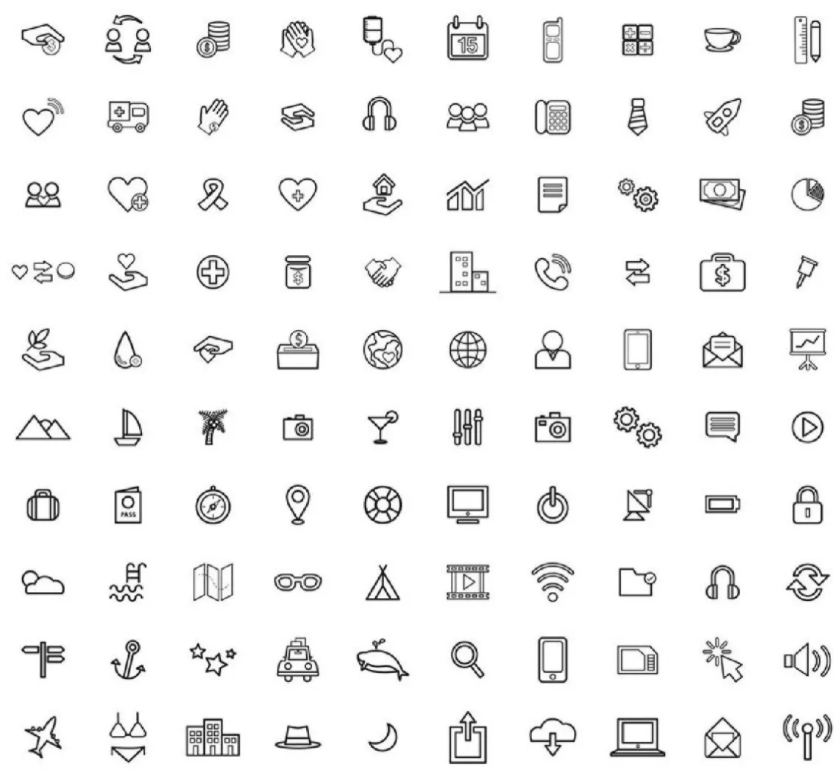

In [42]:
cv2_imshow(img1)

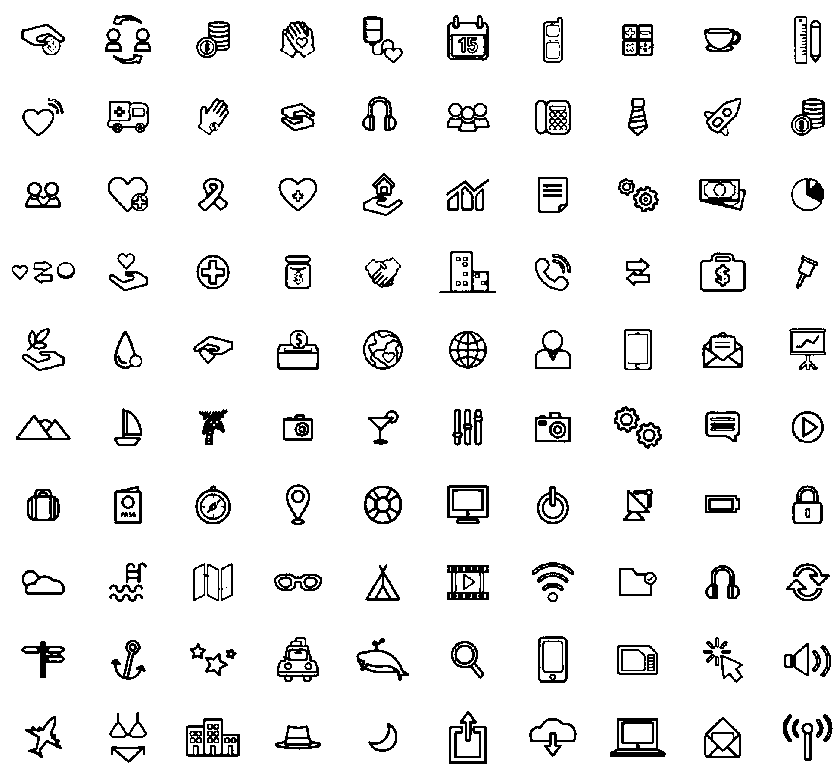

In [43]:
(thresh, img_binaria) = cv2.threshold(img1, 175, 255, cv2.THRESH_BINARY)
cv2_imshow(img_binaria)

In [44]:
img_binaria.shape

(770, 839)

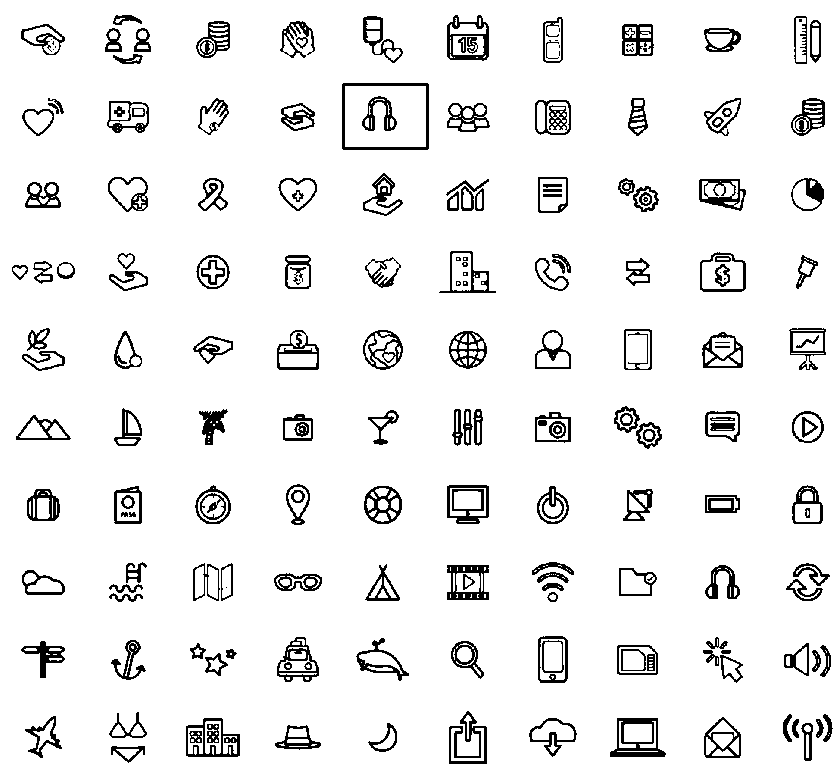

In [45]:
a = img_binaria.copy() 
cv2.rectangle(a, pt1=(77*4+35,84), pt2=(77*6-35,84*2-20), color=(0,0,255), thickness=2)
cv2_imshow(a)

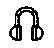

In [46]:
p = img_binaria[90:84*2-30, 77*4+45:77*6-55]
cv2_imshow(p)


In [47]:
p

array([[255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255],
       ...,
       [255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255]], dtype=uint8)

In [48]:
k = np.array([[-1,-1,-1],[-1,8,-1],[-1,-1,-1]])

In [49]:
def convolve2D(image, kernel, padding=0, strides=1):
    # Cross Correlation
    kernel = np.flipud(np.fliplr(kernel))

    # Gather Shapes of Kernel + Image + Padding
    xKernShape = kernel.shape[0]
    yKernShape = kernel.shape[1]
    xImgShape = image.shape[0]
    yImgShape = image.shape[1]

    # Shape of Output Convolution
    xOutput = int(((xImgShape - xKernShape + 2 * padding) / strides) + 1)
    yOutput = int(((yImgShape - yKernShape + 2 * padding) / strides) + 1)
    output = np.zeros((xOutput, yOutput))

    # Apply Equal Padding to All Sides
    if padding != 0:
        imagePadded = np.zeros((image.shape[0] + padding*2, image.shape[1] + padding*2))
        imagePadded[int(padding):int(-1 * padding), int(padding):int(-1 * padding)] = image
        print(imagePadded)
    else:
        imagePadded = image

    # Iterate through image
    for y in range(image.shape[1]):
        # Exit Convolution
        if y > image.shape[1] - yKernShape:
            break
        # Only Convolve if y has gone down by the specified Strides
        if y % strides == 0:
            for x in range(image.shape[0]):
                # Go to next row once kernel is out of bounds
                if x > image.shape[0] - xKernShape:
                    break
                try:
                    # Only Convolve if x has moved by the specified Strides
                    if x % strides == 0:
                        output[x, y] = (kernel * imagePadded[x: x + xKernShape, y: y + yKernShape]).sum()
                except:
                    break

    return output

In [50]:
f = convolve2D(p,k)

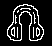

In [51]:
cv2_imshow(f)

<function matplotlib.pyplot.show>

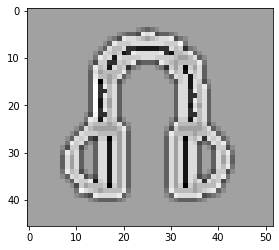

In [52]:
plt.imshow(f,cmap='Greys')
plt.show

In [53]:
unique, counts = np.unique(f, return_counts=True)
dict(zip(unique, counts))

{-1530.0: 6,
 -1275.0: 4,
 -1020.0: 43,
 -765.0: 187,
 -510.0: 79,
 -255.0: 85,
 0.0: 1669,
 255.0: 54,
 510.0: 40,
 765.0: 122,
 1020.0: 32,
 1275.0: 28,
 1530.0: 37,
 1785.0: 6}

In [54]:
f1= f[::-1]
f2= f1[:,::-1] 

<function matplotlib.pyplot.show>

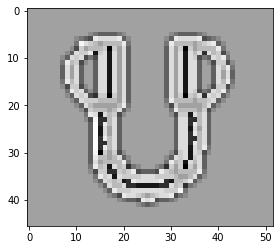

In [55]:
plt.imshow(f1,cmap='Greys')
plt.show

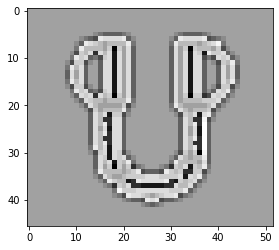

In [56]:
plt.imshow(f2,cmap='Greys')

In [57]:
d = convolve2D(img_binaria,f2)

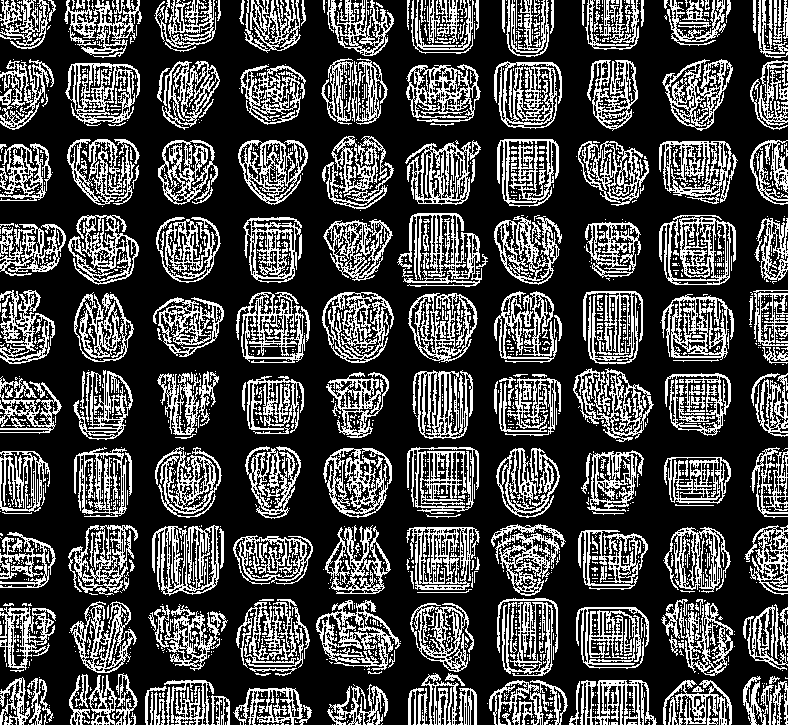

In [58]:
cv2_imshow(d)

In [59]:
#verificar que ambos filtros hacen lo mismo check
#qq= cv2.filter2D(p, -1, cv2.flip(f, -1), borderType=cv2.BORDER_CONSTANT)
#qq2= cv2.filter2D(p, -1, f2, borderType=cv2.BORDER_CONSTANT)
#plt.imshow(qq-qq2,cmap='Greys')

In [60]:
def rescale(arr):
  arr[arr>= arr.min()] += np.abs(arr.min())
  arr = (arr/arr.max())*255
  arr = arr.astype(int)
  return arr

In [61]:
d_resc = rescale(d.copy())

In [62]:
#f2 = rescale(f2)

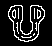

In [63]:
cv2_imshow(f2)

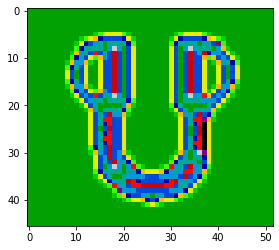

In [64]:
plt.imshow(f2,cmap='nipy_spectral')

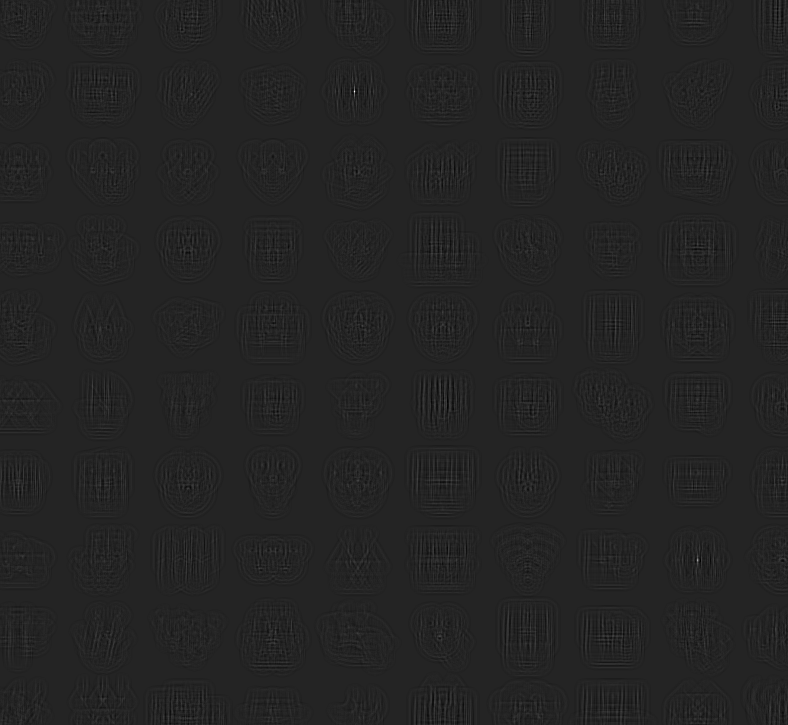

In [65]:
cv2_imshow(d_resc)

In [66]:
cmaps=['viridis', 'plasma', 'inferno', 'magma', 'cividis','Greys', 'Purples', 'Blues', 'Greens', 'Oranges', 'Reds',
                      'YlOrBr', 'YlOrRd', 'OrRd', 'PuRd', 'RdPu', 'BuPu',
                      'GnBu', 'PuBu', 'YlGnBu', 'PuBuGn', 'BuGn', 'YlGn',
                       'binary', 'gist_yarg', 'gist_gray', 'gray', 'bone',
                      'pink', 'spring', 'summer', 'autumn', 'winter', 'cool',
                      'Wistia', 'hot', 'afmhot', 'gist_heat', 'copper',
                      'PiYG', 'PRGn', 'BrBG', 'PuOr', 'RdGy', 'RdBu', 'RdYlBu',
                      'RdYlGn', 'Spectral', 'coolwarm', 'bwr', 'seismic',
                      'twilight', 'twilight_shifted', 'hsv',
                      'Pastel1', 'Pastel2', 'Paired', 'Accent', 'Dark2',
                      'Set1', 'Set2', 'Set3', 'tab10', 'tab20', 'tab20b',
                      'tab20c','flag', 'prism', 'ocean', 'gist_earth', 'terrain',
                      'gist_stern', 'gnuplot', 'gnuplot2', 'CMRmap',
                      'cubehelix', 'brg', 'gist_rainbow', 'rainbow', 'jet', 'nipy_spectral', 'gist_ncar' ]

Se prueban todos los mapas de colores para escoger el con mejor visualizacion

In [67]:
#for el in cmaps:
#  plt.imshow(d_resc,cmap=el)
#  plt.title(el)
#  plt.show()

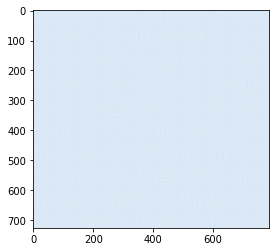

In [68]:
plt.imshow(d_resc,cmap='Blues')

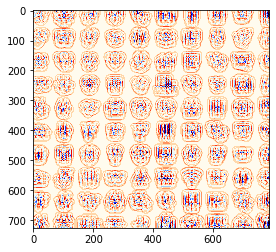

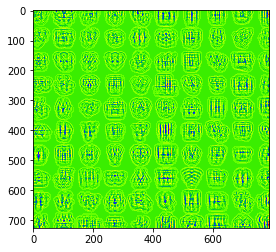

In [69]:
plt.imshow(d_resc,cmap='flag')
plt.show()
plt.imshow(d_resc,cmap='prism')

In [70]:
d_tovec = np.reshape(d,(d.shape[0]*d.shape[1]))

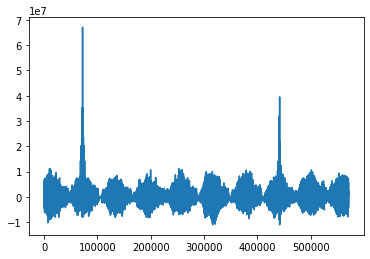

In [71]:
plt.plot(d_tovec)

(35000000.0, 71017053.75)

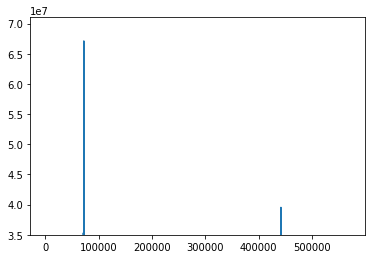

In [72]:
plt.plot(d_tovec)
plt.ylim(3.5*10**7)

In [73]:
posiciones = np.where(d >= 3.7*10**7)
print(posiciones)
posicion1 = posiciones[0]
posicion2 = posiciones[1]

(array([ 91, 560]), array([354, 697]))


In [74]:
print(d.shape, img_binaria.shape)
print(f'la diferencia es {img_binaria.shape[0]-d.shape[0]} y {img_binaria.shape[1]-d.shape[1]}')

(725, 788) (770, 839)
la diferencia es 45 y 51


In [75]:
cuadro = p.shape
cuadro

(48, 54)

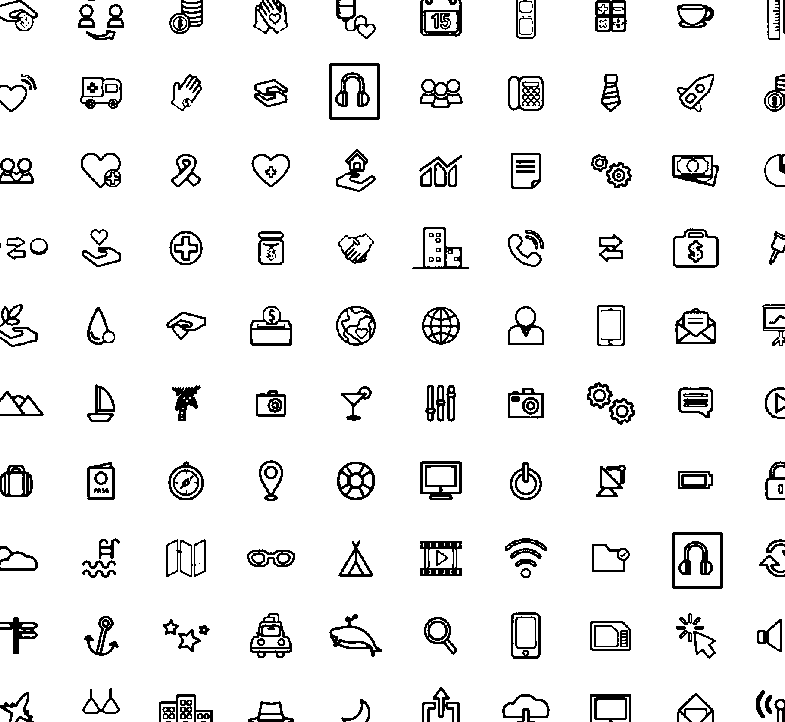

In [76]:
a = img_binaria.copy() 
a = a[cuadro[0]//2:len(a)-cuadro[0]//2,cuadro[1]//2:len(a[0])-cuadro[1]//2]
cv2.rectangle(a, pt1=(posicion2[0]-cuadro[0]//2,posicion1[0]-cuadro[1]//2), pt2=(posicion2[0]+cuadro[0]//2,posicion1[0]+cuadro[1]//2), color=(0,0,255), thickness=2)
cv2.rectangle(a, pt1=(posicion2[1]-cuadro[0]//2,posicion1[1]-cuadro[1]//2), pt2=(posicion2[1]+cuadro[0]//2,posicion1[1]+cuadro[1]//2), color=(0,0,255), thickness=2)
cv2_imshow(a)

In [77]:
def metodo_completo(objeto,imagen_binaria,umbral=0.75,ver_umbral=False, ver_convolucion=False, print_pos=False):
  k = np.array([[-1,-1,-1],[-1,8,-1],[-1,-1,-1]])
  f = convolve2D(objeto,k)
  f= f[::-1]
  f= f[:,::-1] 
  deteccion = convolve2D(imagen_binaria,f)
  deteccion_to_vec = np.reshape(deteccion,(deteccion.shape[0]*deteccion.shape[1]))
  if ver_umbral == True:
    plt.plot(deteccion_to_vec)
    plt.show()
    plt.plot(deteccion_to_vec)
    plt.ylim(deteccion_to_vec.max()*umbral)
    plt.show()
  if ver_convolucion == True:
    det_resc = rescale(deteccion.copy())
    cv2_imshow(det_resc)
  posiciones = np.where(deteccion >= deteccion_to_vec.max()*umbral)
  if print_pos == True:
    print(posiciones)
  posiciony = posiciones[0]
  posicionx = posiciones[1]
  deltay = objeto.shape[0]
  deltax = objeto.shape[1]
  output = imagen_binaria.copy() 
  #output = output[deltax:len(output)-deltax,deltay:len(output[0])-deltay]
  for i in range(len(posicionx)):
    cv2.rectangle(output, pt1=(posicionx[i],posiciony[i]), pt2=(posicionx[i]+deltax,posiciony[i]+deltay), color=(0,0,255), thickness=2)
  cv2_imshow(output)
  print(f'Se han encontrado {len(posicionx)} objetos')


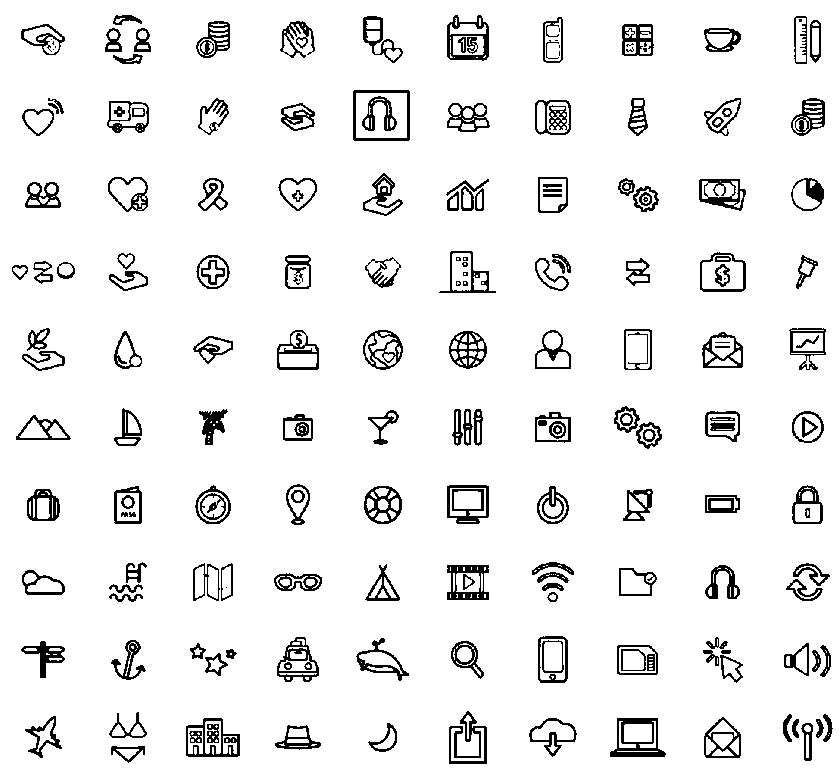

Se han encontrado 1 objetos


In [78]:
metodo_completo(p,img_binaria)

(array([ 91, 560]), array([354, 697]))


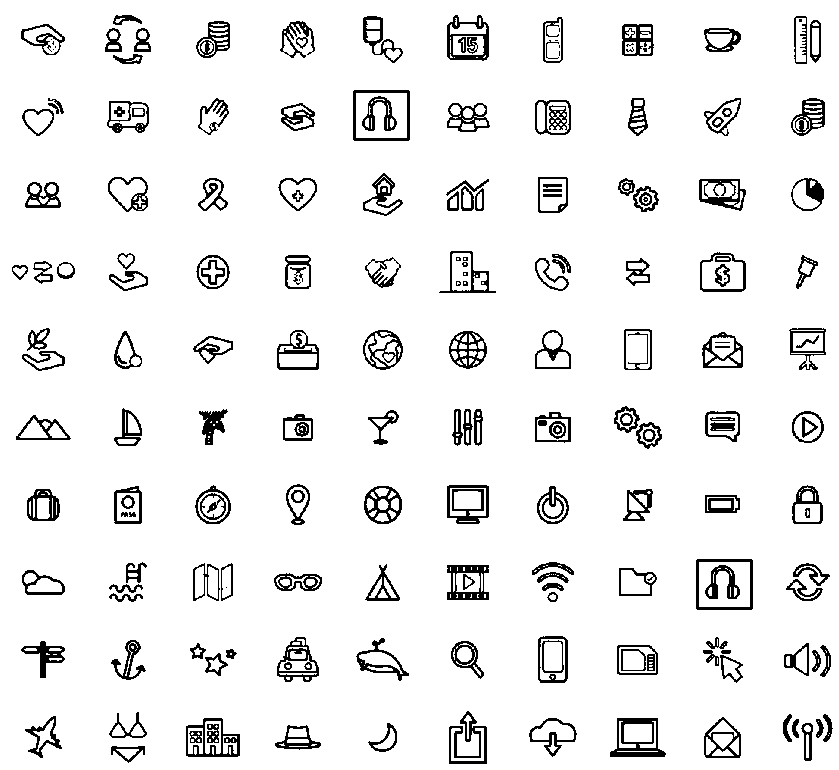

Se han encontrado 2 objetos


In [79]:
metodo_completo(p,img_binaria,0.58,print_pos=True)

(array([ 90,  91,  92, 560]), array([354, 354, 354, 697]))


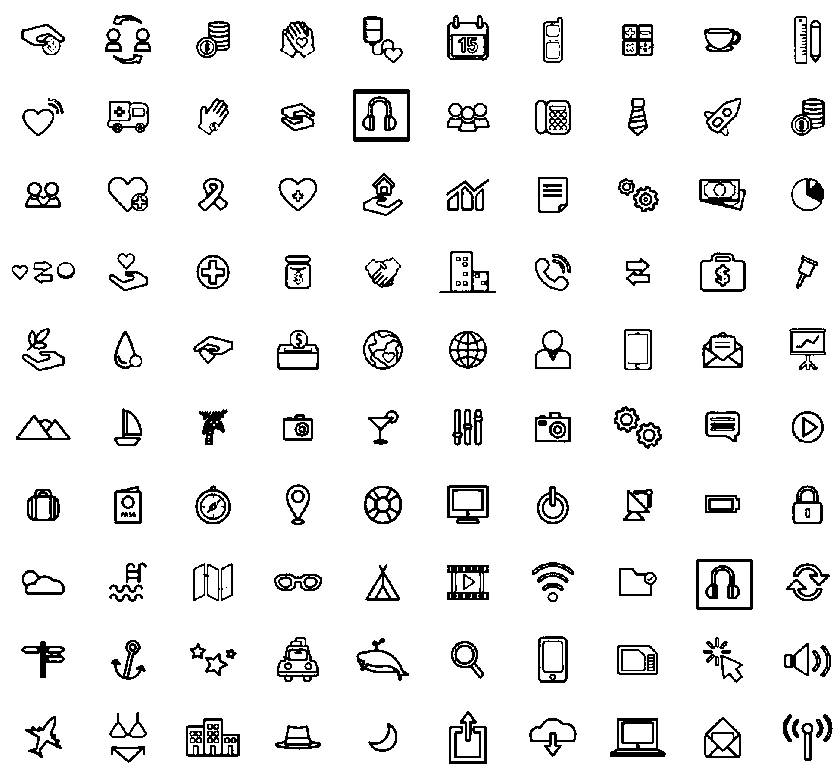

Se han encontrado 4 objetos


In [80]:
metodo_completo(p,img_binaria,0.5,print_pos=True)

In [81]:
img2 = cv2.imread("/content/Img2.PNG")
img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)
#cv2_imshow(img2)

In [82]:
(thresh, img_binaria_2) = cv2.threshold(img2, 175, 255, cv2.THRESH_BINARY)
#cv2_imshow(img_binaria_2)

In [83]:
#b = img_binaria_2.copy() 
#cv2.rectangle(b, pt1=(350//9*2+4,2), pt2=(350//9*4-10,107), color=(0,0,255), thickness=2)
#cv2_imshow(b)

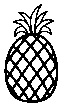

In [84]:
#aca es al reves son y1:y2 x1:x2
pinha = img_binaria_2[2:107, 350//9*2+4:350//9*4-10]
cv2_imshow(pinha)

In [85]:
#b = img_binaria_2.copy() 
#cv2.rectangle(b, pt1=(350//9*2+10,109), pt2=(350//9*4-6,198), color=(0,0,255), thickness=2)
#cv2_imshow(b)

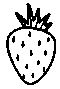

In [86]:
frutilla = img_binaria_2[109:198, 350//9*2+10:350//9*4-6]
cv2_imshow(frutilla)

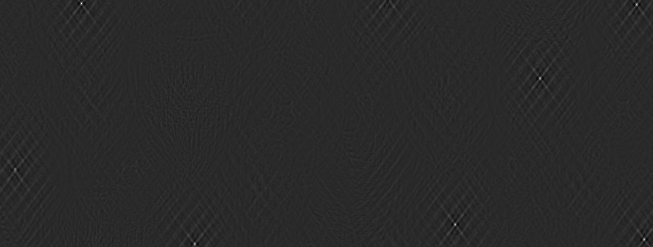

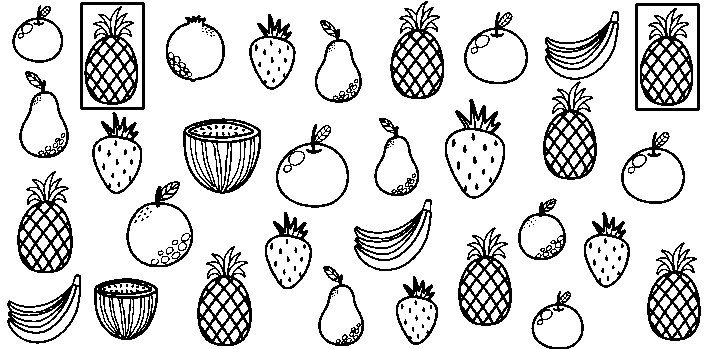

Se han encontrado 2 objetos


In [87]:
metodo_completo(pinha,img_binaria_2,ver_convolucion=True)

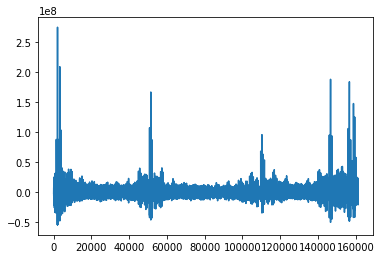

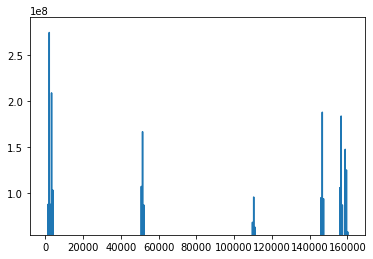

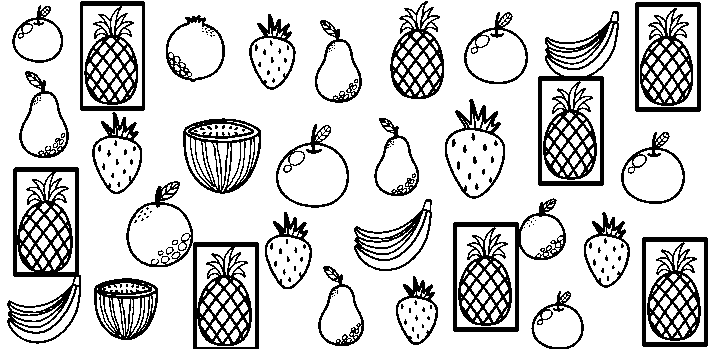

Se han encontrado 37 objetos


In [99]:
metodo_completo(pinha,img_binaria_2,0.2,ver_umbral=True)

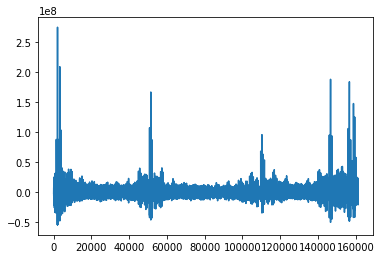

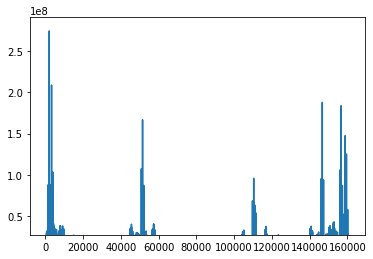

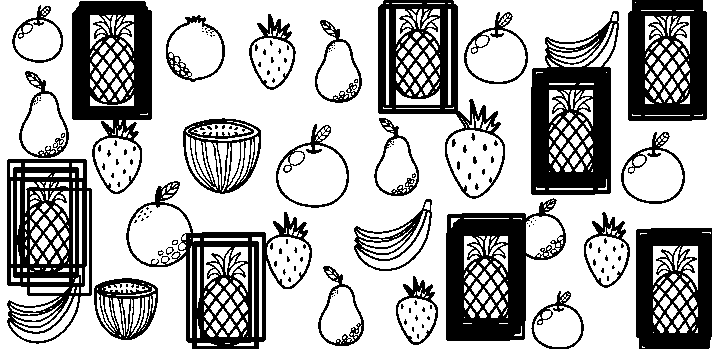

Se han encontrado 161 objetos


In [110]:
metodo_completo(pinha,img_binaria_2,0.1,ver_umbral=True)

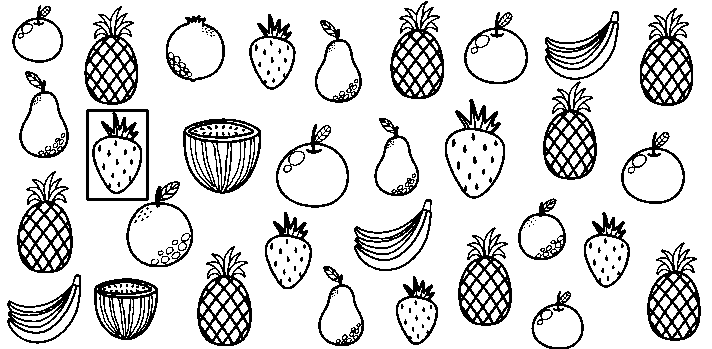

Se han encontrado 1 objetos


In [100]:
metodo_completo(frutilla,img_binaria_2,0.5)

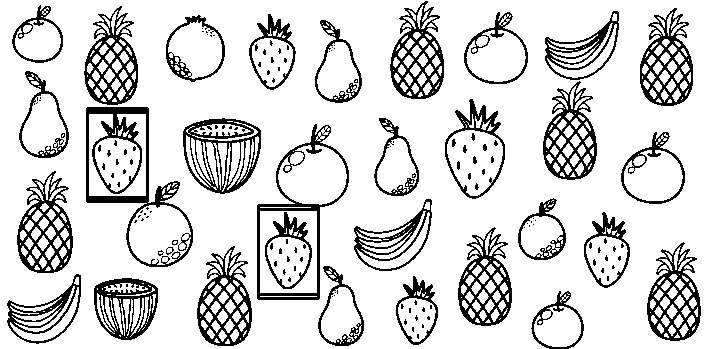

Se han encontrado 7 objetos


In [101]:
metodo_completo(frutilla,img_binaria_2,0.2)

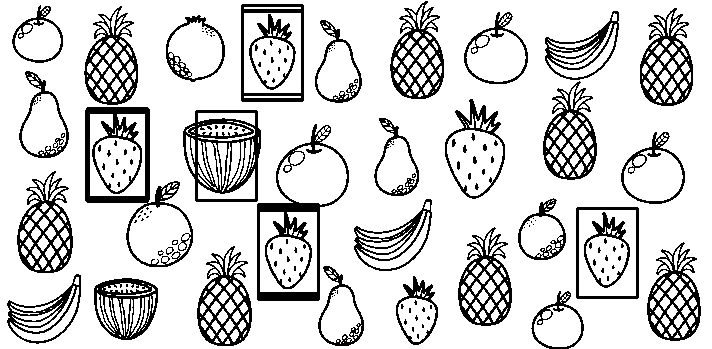

Se han encontrado 20 objetos


In [105]:
metodo_completo(frutilla,img_binaria_2,0.13)

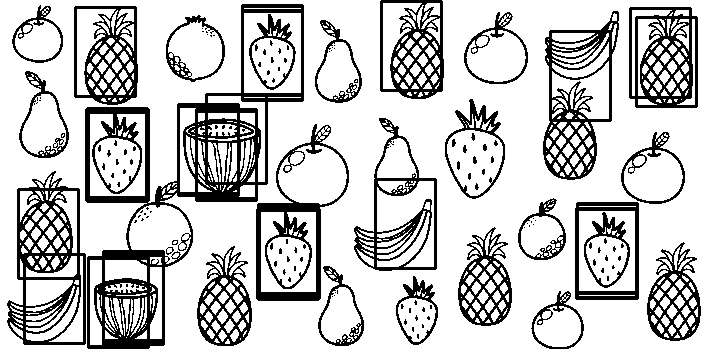

Se han encontrado 52 objetos


In [106]:
metodo_completo(frutilla,img_binaria_2,0.1)

In [107]:
def coinciden(posicion_x,posicion_y,dx,dy):
  repetidos= []
  for i in range(len(posicion_x)-1):
    if np.abs(posicion_x[i]-posicion_x[i+1])<dx:
      if np.abs(posicion_y[i]-posicion_y[i+1])<dy:
        repetidos.append(i)
  posicion_x = np.delete(posicion_x,repetidos)
  posicion_y = np.delete(posicion_y,repetidos)
  return posicion_x,posicion_y



In [108]:
def metodo_completo_NMS(objeto,imagen,umbral=0.75,ver_umbral=False, ver_convolucion=False, print_pos=False):
  imagen = cv2.cvtColor(imagen, cv2.COLOR_BGR2GRAY)
  (thresh, imagen_binaria) = cv2.threshold(imagen, 175, 255, cv2.THRESH_BINARY)
  k = np.array([[-1,-1,-1],[-1,8,-1],[-1,-1,-1]])
  f = convolve2D(objeto,k)
  f= f[::-1]
  f= f[:,::-1] 
  deteccion = convolve2D(imagen_binaria,f)
  deteccion_to_vec = np.reshape(deteccion,(deteccion.shape[0]*deteccion.shape[1]))
  if ver_umbral == True:
    plt.plot(deteccion_to_vec)
    plt.show()
    plt.plot(deteccion_to_vec)
    plt.ylim(deteccion_to_vec.max()*umbral)
    plt.show()
  if ver_convolucion == True:
    det_resc = rescale(deteccion.copy())
    cv2_imshow(det_resc)
  posiciones = np.where(deteccion >= deteccion_to_vec.max()*umbral)
  posiciony = posiciones[0]
  posicionx = posiciones[1]
  deltay = objeto.shape[0]
  deltax = objeto.shape[1]
  posicionx,posiciony = coinciden(posicionx,posiciony,deltax,deltay)
  if print_pos == True:
    print(f'posición de cuadro (filas):{posiciony}, posición de cuadro  columnas: {posicionx}')
  output = imagen.copy() 
  #output = output[deltax:len(output)-deltax,deltay:len(output[0])-deltay]
  for i in range(len(posicionx)):
    cv2.rectangle(output, pt1=(posicionx[i],posiciony[i]), pt2=(posicionx[i]+deltax,posiciony[i]+deltay), color=(0,0,255), thickness=2)
  cv2_imshow(output)
  print(f'Se han encontrado {len(posicionx)} objetos')


posición de cuadro (filas):[ 92 560], posición de cuadro  columnas: [354 697]


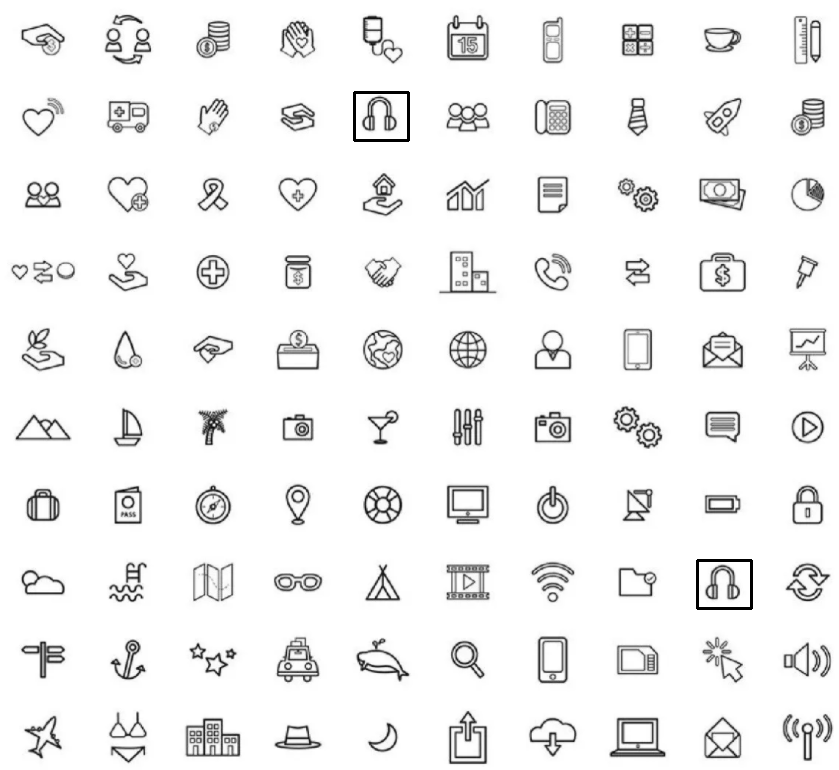

Se han encontrado 2 objetos


In [109]:
img1 = cv2.imread("/content/Img1.PNG")
metodo_completo_NMS(p,img1,0.5,print_pos = True)

posición de cuadro (filas):[  3   4  78 224 239 243], posición de cuadro  columnas: [ 81 636 540 455 644 194]


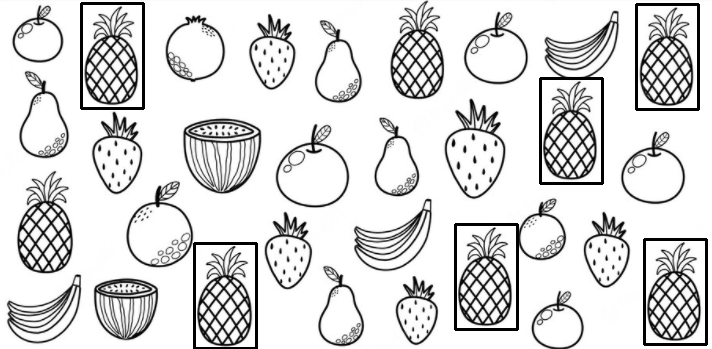

Se han encontrado 6 objetos


In [111]:
img2 = cv2.imread("/content/Img2.PNG")
metodo_completo_NMS(pinha,img2,0.5,print_pos = True)

posición de cuadro (filas):[  3   3   4   5  79 170 225 240 245], posición de cuadro  columnas: [ 81 637  81 637 540  15 455 644 194]


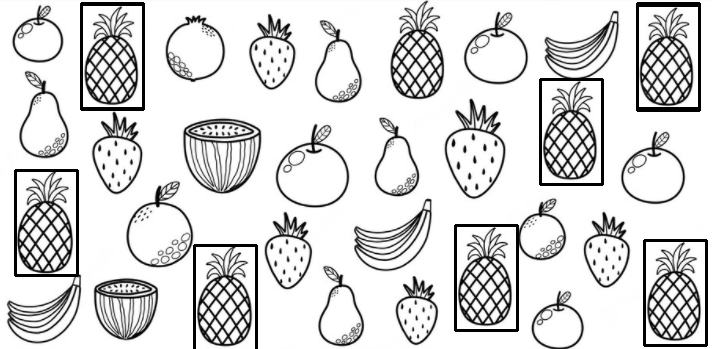

Se han encontrado 9 objetos


In [112]:
img2 = cv2.imread("/content/Img2.PNG")
metodo_completo_NMS(pinha,img2,0.2,print_pos = True)

posición de cuadro (filas):[  0   1   3   3   4   4   5   5   6   7   7   7   8   8  12  12  13  14
  88 189 229 231 232 233 233 234 234 234 235 235 236 240 242 242 244 244
 245], posición de cuadro  columnas: [639 390  82 637  82 637 393 637 394  84 394 634  77 639  88 643  88 629
 532  28 451 638 461 202 461 202 447 647 201 641 188 644 195 646 195 640
 195]


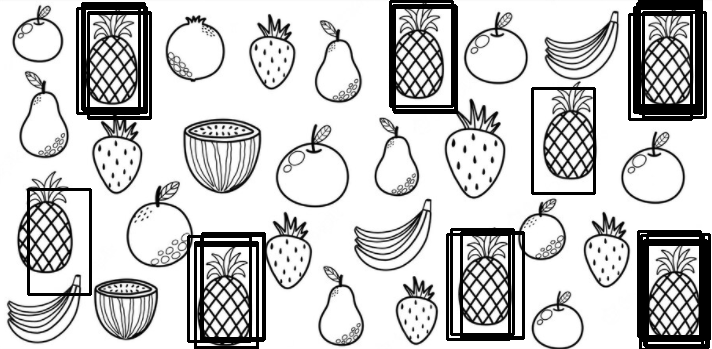

Se han encontrado 37 objetos


In [113]:
img2 = cv2.imread("/content/Img2.PNG")
metodo_completo_NMS(pinha,img2,0.1,print_pos = True)

posición de cuadro (filas):[110], posición de cuadro  columnas: [87]


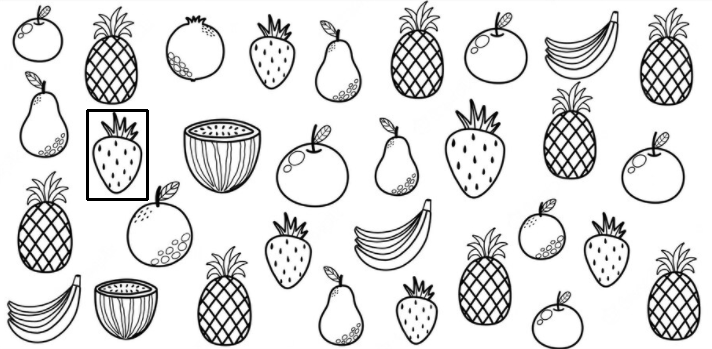

Se han encontrado 1 objetos


In [114]:
img2 = cv2.imread("/content/Img2.PNG")
metodo_completo_NMS(frutilla,img2,0.5,print_pos = True)

posición de cuadro (filas):[112 209], posición de cuadro  columnas: [ 87 258]


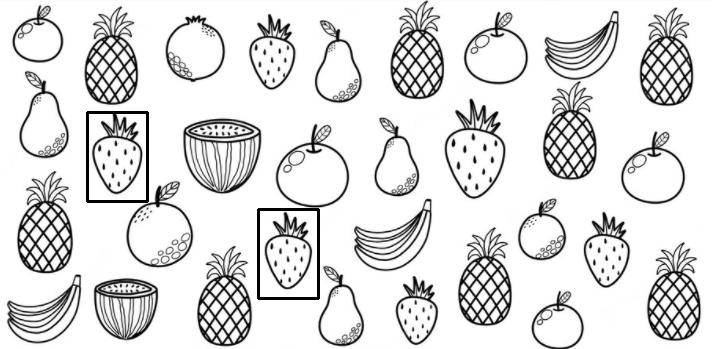

Se han encontrado 2 objetos


In [115]:
img2 = cv2.imread("/content/Img2.PNG")
metodo_completo_NMS(frutilla,img2,0.2,print_pos = True)

posición de cuadro (filas):[ 11 111 111 112 208 208 210], posición de cuadro  columnas: [242  87 196  87 258 577 258]


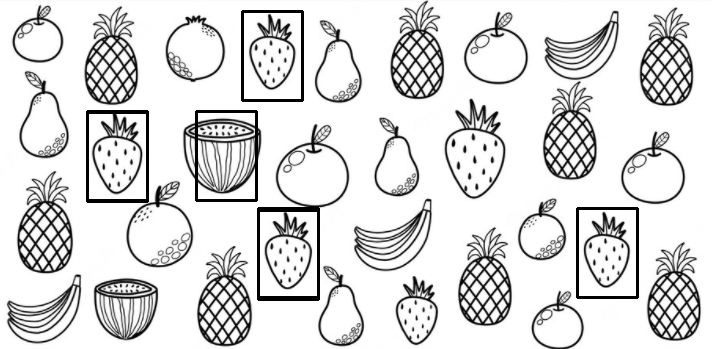

Se han encontrado 7 objetos


In [116]:
img2 = cv2.imread("/content/Img2.PNG")
metodo_completo_NMS(frutilla,img2,0.13,print_pos = True)

posición de cuadro (filas):[  1   6   7   8  11  17  31 106 109 109 110 110 111 111 112 179 189 203
 204 204 208 208 209 209 210 253 254 258], posición de cuadro  columnas: [381 242  75 630 242 636 550 178  88 196  88 196  88 196  87 375  18 577
 258 577 258 577 259 577 258 103  24  88]


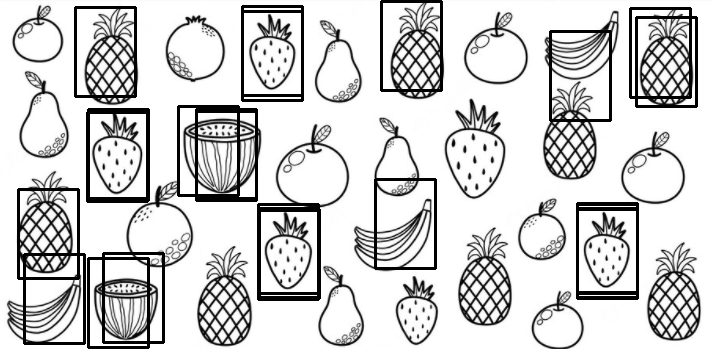

Se han encontrado 28 objetos


In [117]:
img2 = cv2.imread("/content/Img2.PNG")
metodo_completo_NMS(frutilla,img2,0.1,print_pos = True)

#P4

In [2]:
import cv2
from google.colab.patches import cv2_imshow 
import matplotlib.pylab as plt
import numpy as np
import os

In [3]:
import os  
# Path
path = os.path.join('/content/', 'frames_mario')
if os.path.exists(path) == False:
  os.mkdir(path)

In [4]:
# Opens the inbuilt camera of laptop to capture video.
Super_Mario = cv2.VideoCapture("/content/super_mario.mp4",0)
i = 0
 
while(Super_Mario.isOpened()):
    ret, frame = Super_Mario.read()
     
    # This condition prevents from infinite looping
    # incase video ends.
    if ret == False:
        break
     
    # Save Frame by Frame into disk using imwrite method
    cv2.imwrite('/content/frames_mario/Frame'+str(i)+'.jpg', frame)
    i += 1
 
Super_Mario.release()
cv2.destroyAllWindows()

In [5]:
from natsort import natsorted
def load_images_from_folder(folder,bn=False,treshold=110):
    images = []
    for filename in natsorted(os.listdir(folder)):
        
        img = cv2.imread(os.path.join(folder,filename))
        if bn == True:
          img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
          (thresh, img) = cv2.threshold(img, treshold, 255, cv2.THRESH_BINARY)

        if img is not None:
            images.append(img)
    return images

In [6]:
frames = load_images_from_folder('/content/frames_mario')

In [7]:
#frames_BN = load_images_from_folder('/content/frames_mario',bn=True,treshold=110)

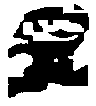

In [8]:
jump = cv2.imread(os.path.join('/content/frames_mario/Frame145.jpg'))
jump = cv2.cvtColor(jump, cv2.COLOR_BGR2GRAY)
(thresh, jump) = cv2.threshold(jump, 110, 255, cv2.THRESH_BINARY)
jump= jump[354:460, 552:648]
cv2_imshow(jump)

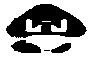

In [9]:
goomba1 = cv2.imread(os.path.join('/content/frames_mario/Frame296.jpg'))
goomba1 = cv2.cvtColor(goomba1, cv2.COLOR_BGR2GRAY)
(thresh, goomba1) = cv2.threshold(goomba1, 110, 255, cv2.THRESH_BINARY)
goomba1= goomba1[324:384, 414:506]
cv2_imshow(goomba1)

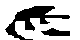

In [10]:
mario_face = cv2.imread(os.path.join('/content/frames_mario/Frame9.jpg'))
mario_face = cv2.cvtColor(mario_face, cv2.COLOR_BGR2GRAY)
(thresh, mario_face) = cv2.threshold(mario_face, 110, 255, cv2.THRESH_BINARY)
mario_face= mario_face[530:570, 460:540]
cv2_imshow(mario_face)

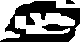

In [11]:
mario_face1 = cv2.imread(os.path.join('/content/frames_mario/Frame10.jpg'))
mario_face1 = cv2.cvtColor(mario_face1, cv2.COLOR_BGR2GRAY)
(thresh, mario_face1) = cv2.threshold(mario_face1, 110, 255, cv2.THRESH_BINARY)
mario_face1= mario_face1[508:550, 470:550]
cv2_imshow(mario_face1)

In [12]:
def convolve2D(image, kernel, padding=0, strides=1):
    # Cross Correlation
    kernel = np.flipud(np.fliplr(kernel))

    # Gather Shapes of Kernel + Image + Padding
    xKernShape = kernel.shape[0]
    yKernShape = kernel.shape[1]
    xImgShape = image.shape[0]
    yImgShape = image.shape[1]

    # Shape of Output Convolution
    xOutput = int(((xImgShape - xKernShape + 2 * padding) / strides) + 1)
    yOutput = int(((yImgShape - yKernShape + 2 * padding) / strides) + 1)
    output = np.zeros((xOutput, yOutput))

    # Apply Equal Padding to All Sides
    if padding != 0:
        imagePadded = np.zeros((image.shape[0] + padding*2, image.shape[1] + padding*2))
        imagePadded[int(padding):int(-1 * padding), int(padding):int(-1 * padding)] = image
        print(imagePadded)
    else:
        imagePadded = image

    # Iterate through image
    for y in range(image.shape[1]):
        # Exit Convolution
        if y > image.shape[1] - yKernShape:
            break
        # Only Convolve if y has gone down by the specified Strides
        if y % strides == 0:
            for x in range(image.shape[0]):
                # Go to next row once kernel is out of bounds
                if x > image.shape[0] - xKernShape:
                    break
                try:
                    # Only Convolve if x has moved by the specified Strides
                    if x % strides == 0:
                        output[x, y] = (kernel * imagePadded[x: x + xKernShape, y: y + yKernShape]).sum()
                except:
                    break

    return output

In [13]:
def coinciden(posicion_x,posicion_y,dx,dy):
  repetidos= []
  for i in range(len(posicion_x)-1):
    if np.abs(posicion_x[i]-posicion_x[i+1])<dx:
      if np.abs(posicion_y[i]-posicion_y[i+1])<dy:
        repetidos.append(i)
  posicion_x = np.delete(posicion_x,repetidos)
  posicion_y = np.delete(posicion_y,repetidos)
  return posicion_x,posicion_y



In [14]:
def  metodo_completo_Mario(objeto,img,file_name):
    imagen = img.copy()
    imagen = cv2.cvtColor(imagen, cv2.COLOR_BGR2GRAY)
    (thresh, imagen_binaria) = cv2.threshold(imagen, 110, 255, cv2.THRESH_BINARY)
    k = np.array([[-1,-1,-1],[-1,8,-1],[-1,-1,-1]])
    f = convolve2D(objeto,k)
    f= f[::-1]
    f= f[:,::-1] 
    deteccion = convolve2D(imagen_binaria,f)
    deteccion_to_vec = np.reshape(deteccion,(deteccion.shape[0]*deteccion.shape[1]))
    posiciones = np.where(deteccion >= deteccion_to_vec.max()*0.75)
    posiciony = posiciones[0]
    posicionx = posiciones[1]
    deltay = objeto.shape[0]
    deltax = objeto.shape[1]
    posicionx,posiciony = coinciden(posicionx,posiciony,deltax,deltay)
    #print(f'posición de cuadro (filas):{posiciony+deltay//2}, posición de cuadro  columnas: {posicionx+deltax//2}')
    output = img
    for i in range(len(posicionx)):
      cv2.rectangle(output, pt1=(posicionx[i],posiciony[i]), pt2=(posicionx[i]+deltax,posiciony[i]+deltay), color=(255,0,0), thickness=2)
    cv2.imwrite(file_name, output)
    return 

In [15]:
import os  
# Path
path = os.path.join('/content/', 'tracking_salto')
if os.path.exists(path) == False:
  os.mkdir(path)

In [33]:
i=0
for img in frames:
  metodo_completo_Mario(jump,img,f'/content/tracking_salto/jump_{i}.jpg')
  i+=1
  print(i)

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
277


In [34]:
!ffmpeg -f image2 -i /content/tracking_salto/jump_%d.jpg -r 25 -c:v libx264 tracking_salto.mp4

ffmpeg version 3.4.8-0ubuntu0.2 Copyright (c) 2000-2020 the FFmpeg developers
  built with gcc 7 (Ubuntu 7.5.0-3ubuntu1~18.04)
  configuration: --prefix=/usr --extra-version=0ubuntu0.2 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --enable-gpl --disable-stripping --enable-avresample --enable-avisynth --enable-gnutls --enable-ladspa --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librubberband --enable-librsvg --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libssh --enable-libtheora --enable-libtwolame --enable-libvorbis --enable-libvpx --enable-libwavpack --enable-libwebp --enable-libx265 --enable-libxml2 --enable-libxvid --enable-lib

In [18]:
def show_local_mp4_video(file_name, width=640, height=480):
  import io
  import base64
  from IPython.display import HTML
  video_encoded = base64.b64encode(io.open(file_name, 'rb').read())
  return HTML(data='''<video width="{0}" height="{1}" alt="test" controls>
                        <source src="data:video/mp4;base64,{2}" type="video/mp4" />
                      </video>'''.format(width, height, video_encoded.decode('ascii')))

In [36]:
show_local_mp4_video('/content/tracking_salto.mp4', width=352, height=228)

In [20]:
def  metodo_completo_Mario1(objeto,frames,file_name):
    j=0
    for imagen in frames:
      output = imagen
      imagen = cv2.cvtColor(imagen, cv2.COLOR_BGR2GRAY)
      (thresh, imagen_binaria) = cv2.threshold(imagen, 110, 255, cv2.THRESH_BINARY)
      k = np.array([[-1,-1,-1],[-1,8,-1],[-1,-1,-1]])
      f = convolve2D(objeto,k)
      f= f[::-1]
      f= f[:,::-1] 
      deteccion = convolve2D(imagen_binaria,f)
      deteccion_to_vec = np.reshape(deteccion,(deteccion.shape[0]*deteccion.shape[1]))
      posiciones = np.where(deteccion >= deteccion_to_vec.max()*0.75)
      posiciony = posiciones[0]
      posicionx = posiciones[1]
      deltay = objeto.shape[0]
      deltax = objeto.shape[1]
      posicionx,posiciony = coinciden(posicionx,posiciony,deltax,deltay)
      for i in range(len(posicionx)):
        cv2.rectangle(output, pt1=(posicionx[i],posiciony[i]), pt2=(posicionx[i]+deltax,posiciony[i]+deltay), color=(255,0,0), thickness=2)
      cv2.imwrite(f'{file_name}_{j}.jpg', output)
      print(j)
      j+=1
    return 

In [21]:
import os  
# Path
path = os.path.join('/content/', 'tracking_goomba')
if os.path.exists(path) == False:
  os.mkdir(path)

In [ ]:
metodo_completo_Mario1(goomba1,frames,'/content/tracking_goomba/goomba')

In [23]:
!ffmpeg -f image2 -i /content/tracking_goomba/goomba_%d.jpg -r 25 -c:v libx264 tracking_goomba.mp4

ffmpeg version 3.4.8-0ubuntu0.2 Copyright (c) 2000-2020 the FFmpeg developers
  built with gcc 7 (Ubuntu 7.5.0-3ubuntu1~18.04)
  configuration: --prefix=/usr --extra-version=0ubuntu0.2 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --enable-gpl --disable-stripping --enable-avresample --enable-avisynth --enable-gnutls --enable-ladspa --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librubberband --enable-librsvg --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libssh --enable-libtheora --enable-libtwolame --enable-libvorbis --enable-libvpx --enable-libwavpack --enable-libwebp --enable-libx265 --enable-libxml2 --enable-libxvid --enable-lib

In [24]:
show_local_mp4_video('/content/tracking_goomba.mp4', width=352, height=228)

In [ ]:
import os  
# Path
path = os.path.join('/content/', 'tracking_cara')
if os.path.exists(path) == False:
  os.mkdir(path)

In [26]:
#metodo_completo_Mario1(mario_face1,frames,'/content/tracking_goomba/goomba')

In [27]:
#!ffmpeg -f image2 -i /content/tracking_goomba/goomba_%d.jpg -r 25 -c:v libx264 tracking_goomba.mp4

In [28]:
#show_local_mp4_video('/content/tracking_goomba.mp4', width=352, height=228)

In [29]:
import os  
# Path
path = os.path.join('/content/', 'tracking_cara')
if os.path.exists(path) == False:
  os.mkdir(path)

In [ ]:
metodo_completo_Mario1(mario_face1,frames,'/content/tracking_cara/cara')

In [ ]:
!ffmpeg -f image2 -i /content/tracking_cara/cara_%d.jpg -r 25 -c:v libx264 tracking_cara.mp4

In [32]:
show_local_mp4_video('/content/tracking_cara.mp4', width=352, height=228)

In [37]:
!ffmpeg -f image2 -i /content/saltgod/jump_%d.jpg -r 25 -c:v libx264 tracking_saltgod.mp4

ffmpeg version 3.4.8-0ubuntu0.2 Copyright (c) 2000-2020 the FFmpeg developers
  built with gcc 7 (Ubuntu 7.5.0-3ubuntu1~18.04)
  configuration: --prefix=/usr --extra-version=0ubuntu0.2 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --enable-gpl --disable-stripping --enable-avresample --enable-avisynth --enable-gnutls --enable-ladspa --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librubberband --enable-librsvg --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libssh --enable-libtheora --enable-libtwolame --enable-libvorbis --enable-libvpx --enable-libwavpack --enable-libwebp --enable-libx265 --enable-libxml2 --enable-libxvid --enable-lib

In [38]:
show_local_mp4_video('/content/tracking_saltgod.mp4', width=352, height=228)